En esta parte, estamos interesados en ver la temperatura como una serie de timepo, observando como ha cambiado esta a traves del tiempo, por eso estamos interesados en distintas metricas de los datos, primero solo en la temperatura anaual, para todo el planeta y para regiones específicas de este, utilizando serie s de Fourier quermeos observar como es que se comporta el power spectrum de estos datos 

In [1]:
pip install -U kaleido

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 24.2
[notice] To update, run: C:\Users\danie\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [19]:
import numpy as np
import xarray as xr
import cf_xarray as cfxr
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.feature as cfeature
from scipy.interpolate import griddata
import regionmask
import pandas as pd
import seaborn as sns
from pydmd import DMD, BOPDMD
from pydmd.plotter import plot_eigs, plot_summary
from pydmd.preprocessing import hankel_preprocessing
from sklearn.preprocessing import StandardScaler
import math
import plotly.express as px
import geopandas as gpd
from shapely.geometry import Point
from shapely.geometry import Polygon
from scipy.spatial import distance_matrix
import plotly.graph_objects as go
import kaleido
import requests
from io import StringIO
import pwlf
from scipy.stats import skew

In [3]:

fN = ("Datos\Land_and_Ocean_EqualArea.nc") 

ds = xr.open_dataset(fN)
years_approx = np.floor(ds['time'])
temp = ds['temperature'].groupby(years_approx).mean('time')
longitude = ds.variables['longitude'][:]  
latitude = ds.variables['latitude'][:]
time = ds.variables['time'][:]
land_mask = ds.variables['land_mask'][:]
temperature = ds.variables['temperature'][:]
climatology = ds.variables['climatology'][:]

In [4]:

# Convertir los datos de temperatura a un DataFrame
temperature_df = pd.read_csv("Datos/temperatura.csv",index_col="time")

# Revisar el resultado para asegurarse de que tiene el formato correcto
temperature_df.head()


,point_1,point_2,point_3,point_4,point_5,point_6,point_7,point_8,point_9,point_10,...,point_15975,point_15976,point_15977,point_15978,point_15979,point_15980,point_15981,point_15982,point_15983,point_15984
time,,,,,,,,,,,,,,,,,,,,,
1850.041667,NaN,NaN,NaN,NaN,NaN,NaN,0.464756,0.681552,0.785687,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.125000,NaN,NaN,NaN,NaN,NaN,NaN,-1.490464,-1.236933,-0.806517,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.208333,NaN,NaN,NaN,NaN,NaN,NaN,-0.157294,-0.230608,-0.166150,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.291667,NaN,NaN,NaN,NaN,NaN,NaN,-0.139167,-0.058191,-0.072071,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1850.375000,NaN,NaN,NaN,NaN,NaN,NaN,-0.878162,-0.964870,-1.003502,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
# Define las regiones AR6 utilizando regionmask
regions_ar6 = regionmask.defined_regions.ar6.all
temp_regions=pd.read_csv("Datos/temperaturaregionesipcc.csv",index_col="time")
temp_regions.head()

,Region 0,Region 1,Region 2,Region 3,Region 4,Region 5,Region 6,Region 7,Region 8,Region 9,...,Region 48,Region 49,Region 50,Region 51,Region 52,Region 53,Region 54,Region 55,Region 56,Region 57
time,,,,,,,,,,,,,,,,,,,,,
1850.041667,0.136235,-1.330789,0.008371,-1.081719,1.557231,1.357871,0.177940,0.005466,-0.013133,-0.725280,...,-0.754152,0.052812,-0.122649,-0.443389,-0.459247,-0.106958,-0.059162,-0.013802,-0.037105,-0.228845
1850.125000,-2.766186,0.903567,0.457267,-1.672187,-0.238511,0.841829,-0.398261,0.037664,-0.005968,-0.345103,...,-0.929530,0.314541,-0.209424,-0.341581,-1.092278,-0.146366,0.671129,0.367911,0.032516,-0.330520
1850.208333,-0.290138,-1.243747,-0.128986,-2.131074,-1.220055,-0.509307,-0.421122,0.153145,-0.047957,-0.186628,...,-0.766979,-0.177736,-0.228850,-0.490354,-0.456664,-0.462185,-0.215787,-0.304528,-0.054666,0.138855
1850.291667,0.248451,-1.428141,-1.840282,-0.240155,-3.188819,-1.529099,-0.744390,-0.017132,-0.094589,-0.157292,...,-0.403917,-0.471322,-0.146334,-0.470825,-0.542606,-0.543796,-0.349228,-0.271987,-0.158646,0.081552
1850.375000,0.256227,-1.246234,-1.437419,-0.391208,-1.781213,-1.727687,-1.144015,0.459868,0.275922,-0.132240,...,0.048388,-0.553649,0.094990,-0.382022,-0.085905,-0.260265,-0.337365,-0.180721,-0.149693,-0.609608


In [6]:

land_mask_values = ds['land_mask'].values
unique_land_mask_values = np.unique(land_mask_values)
unique_land_mask_values

# Usar el valor entero (parte entera) de los tiempos flotantes como aproximación a "año"
# Esto asume que el año está representado directamente como un número flotante
dates = np.floor(ds['time'])

# Agrupar por estos años aproximados y calcular la media de la temperatura
temp = ds['temperature'].groupby(years_approx).mean('time')


# Separar las temperaturas en tierra y mar basándose en el 'land_mask'
# Considerar cualquier valor de 'land_mask' > 0 como tierra
is_land = land_mask_values > 0

# Temperaturas donde es tierra
temperature_land = ds['temperature'].where(is_land)

# Temperaturas donde es mar (negación de is_land)
temperature_sea = ds['temperature'].where(~is_land)

# Calcular la temperatura media anual para tierra y mar
annual_mean_temperature_land = temperature_land.groupby(dates).mean(dim=['time', 'map_points'])
annual_mean_temperature_sea = temperature_sea.groupby(dates).mean(dim=['time', 'map_points'])
# Calcular la desviación anual para tierra y mar
annual_std_temperature_land = temperature_land.groupby(dates).std(dim=['time', 'map_points'])
annual_std_temperature_sea = temperature_sea.groupby(dates).std(dim=['time', 'map_points'])
# Calcular la var anual para tierra y mar
annual_var_temperature_land = temperature_land.groupby(dates).var(dim=['time', 'map_points'])
annual_var_temperature_sea = temperature_sea.groupby(dates).var(dim=['time', 'map_points'])
annual_mean_temperature_land, annual_mean_temperature_sea


(<xarray.DataArray 'temperature' (time: 175)> Size: 700B
 array([-0.6116513 , -0.39715376, -0.47131598, -0.46754357, -0.34948713,
        -0.4413031 , -0.47487193, -0.7085741 , -0.42646918, -0.22443046,
        -0.56777054, -0.64176524, -0.9526564 , -0.35228318, -0.54712564,
        -0.35908064, -0.30264416, -0.19803175, -0.3843545 , -0.17906176,
        -0.3883681 , -0.4960546 , -0.3950557 , -0.2930972 , -0.19983791,
        -0.5749346 , -0.4199104 , -0.03559515,  0.28798628, -0.32406768,
        -0.4399538 , -0.23830725, -0.3737743 , -0.46876946, -0.66265595,
        -0.5442405 , -0.52421963, -0.5807033 , -0.38082722, -0.17662732,
        -0.52965444, -0.46818283, -0.45980513, -0.44748312, -0.35957053,
        -0.337237  , -0.28654888, -0.18221706, -0.36105296, -0.1542841 ,
        -0.00983609, -0.0572198 , -0.31903154, -0.3496894 , -0.47634688,
        -0.332733  , -0.1995229 , -0.5578545 , -0.39380157, -0.39708263,
        -0.37141582, -0.41177544, -0.41592464, -0.3353899 , -0.0640

In [7]:

temperature_mean = temperature_df.mean(axis=1)
# Calcular la media móvil de 12 años y la desviación estándar móvil
moving_average = temperature_mean.rolling(window=12).mean()
moving_std = temperature_mean.std()

# Calcular el intervalo de confianza del 95% para la media móvil
confidence_interval_upper = moving_average + 1.96 * moving_std / np.sqrt(12)
confidence_interval_lower = moving_average - 1.96 * moving_std / np.sqrt(12)

# Crear la gráfica base con la temperatura media
fig = go.Figure()

# Añadir la media móvil de 12 años
fig.add_trace(go.Scatter(x=temperature_mean.index, y=moving_average, mode='lines', name='Media Móvil 12 Años',line=dict(color='red')))

# Añadir el intervalo de confianza como una región sombreada
fig.add_trace(go.Scatter(x=temperature_mean.index.tolist() + temperature_mean.index.tolist()[::-1],
                         y=confidence_interval_upper.tolist() + confidence_interval_lower.tolist()[::-1],
                         fill='toself', fillcolor='rgba(0,100,80,0.2)',
                         line=dict(color='rgba(255,255,255,0)'),
                         name='Intervalo de Confianza 95%'))

# Añadir la serie de temperatura promedio original para referencia
fig.add_trace(go.Scatter(x=temperature_mean.index, y=temperature_mean, mode='lines', name='Temperatura Promedio', line=dict(color='gray', dash='dash')))

# Actualizar el layout de la gráfica
fig.update_layout(title='Temperatura Promedio y Media Móvil de 12 Años con Intervalo de Confianza',
                  xaxis_title='Tiempo', yaxis_title='Temperatura Promedio (°C)',
                  legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))

# Mostrar la gráfica
fig.show()


C:\Users\danie\AppData\Local\Temp\ipykernel_8904\140085475.py:20: MatplotlibDeprecationWarning:

The 'use_line_collection' parameter of stem() was deprecated in Matplotlib 3.6 and will be removed two minor releases later. If any parameter follows 'use_line_collection', they should be passed as keyword, not positionally.



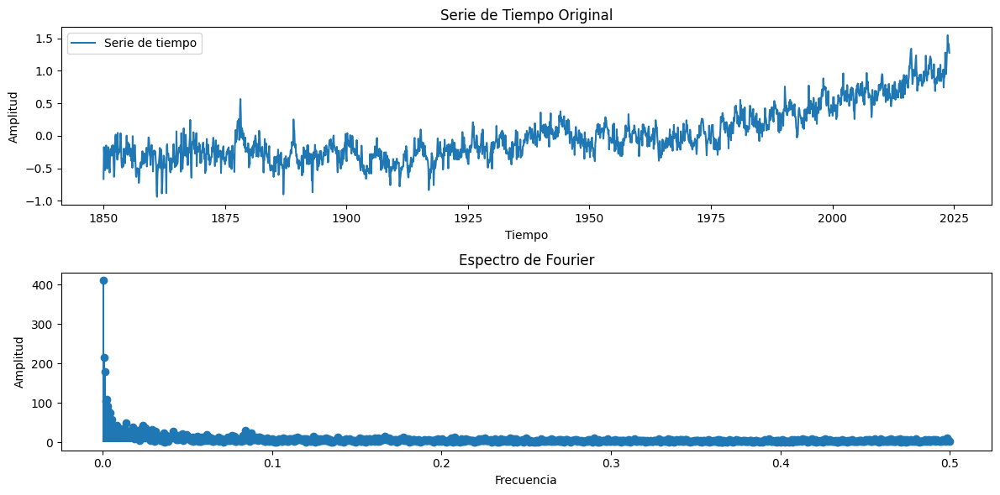

In [8]:
# Calcular la Transformada de Fourier Discreta
fourier_transform = np.fft.fft(temperature_mean)
frequencies = np.fft.fftfreq(len(temperature_mean), d=1)

# Obtener las amplitudes y filtrar frecuencias positivas
amplitudes = np.abs(fourier_transform)
positive_frequencies = frequencies > 0

# Graficar la serie de tiempo original
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot( temperature_mean, label="Serie de tiempo")
plt.title("Serie de Tiempo Original")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.legend()

# Graficar el espectro de Fourier
plt.subplot(2, 1, 2)
plt.stem(frequencies[positive_frequencies], amplitudes[positive_frequencies], basefmt=" ", use_line_collection=True)
plt.title("Espectro de Fourier")
plt.xlabel("Frecuencia")
plt.ylabel("Amplitud")
plt.tight_layout()
plt.show()


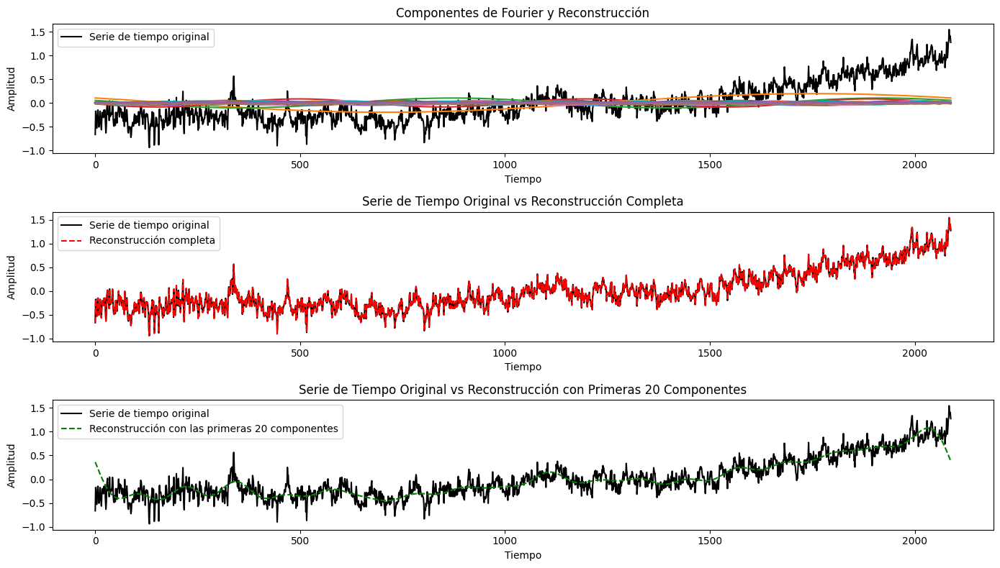

In [9]:
t = np.arange(len(temperature_mean))

# Calcular la Transformada de Fourier Discreta
fourier_transform = np.fft.fft(temperature_mean)
n = temperature_mean.size
frequencies = np.fft.fftfreq(n, d=1)  # Asumiendo que el paso de tiempo entre datos es 1

# Preparar la reconstrucción de la serie de tiempo a partir de los componentes de Fourier
reconstruccion = np.zeros_like(temperature_mean)
reconstruccion_10 = np.zeros_like(temperature_mean)  # Para las primeras 10 componentes

# Graficar la serie de tiempo original
plt.figure(figsize=(14, 8))
plt.subplot(3, 1, 1)
plt.plot(t, temperature_mean, label="Serie de tiempo original", color='black')
plt.title("Componentes de Fourier y Reconstrucción")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.legend()

# Graficar cada componente y sumar para la reconstrucción
for idx, freq in enumerate(frequencies):
    if idx <= n // 2 and np.abs(fourier_transform[idx]) > 1e-10:  # Filtrar componentes irrelevantes
        amplitude = np.abs(fourier_transform[idx]) / n
        phase = np.angle(fourier_transform[idx])
        componente = amplitude * np.cos(2 * np.pi * freq * t + phase)
        reconstruccion += componente * 2  # Sumar el doble de cada componente porque la mitad va para frecuencias negativas
        if idx < 20:
            reconstruccion_10 += componente * 2  # Sumar solo las primeras 10 componentes
        plt.plot(t, componente, label=f"Componente {idx+1}") if idx < 10 else plt.plot(t, componente)  # Etiquetar solo las primeras 10

# Graficar la reconstrucción completa
plt.subplot(3, 1, 2)
plt.plot(t, temperature_mean, label="Serie de tiempo original", color='black')
plt.plot(t, reconstruccion, label="Reconstrucción completa", linestyle='--', color='red')
plt.title("Serie de Tiempo Original vs Reconstrucción Completa")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.legend()

# Graficar la reconstrucción usando solo las primeras 10 componentes
plt.subplot(3, 1, 3)
plt.plot(t, temperature_mean, label="Serie de tiempo original", color='black')
plt.plot(t, reconstruccion_10, label="Reconstrucción con las primeras 20 componentes", linestyle='--', color='green')
plt.title("Serie de Tiempo Original vs Reconstrucción con Primeras 20 Componentes")
plt.xlabel("Tiempo")
plt.ylabel("Amplitud")
plt.legend()

plt.tight_layout()
plt.show()


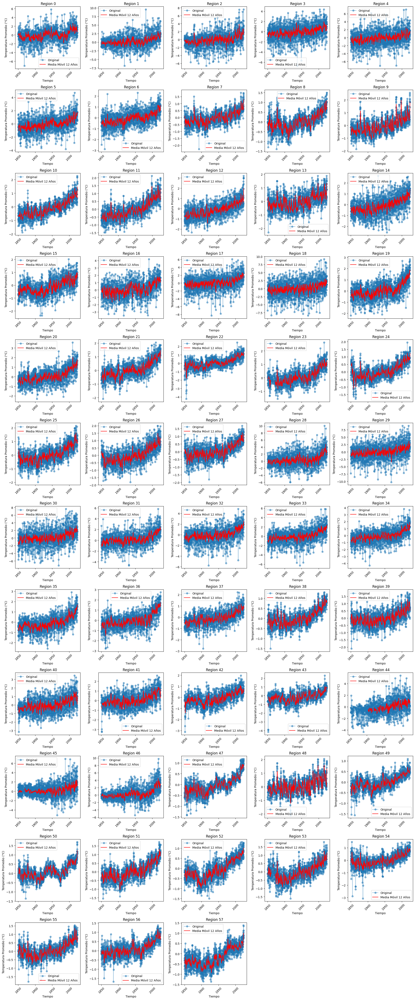

In [10]:


# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias
num_regions = len(temp_regions.columns)
total_rows = math.ceil(num_regions / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

for i, column in enumerate(temp_regions.columns, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    
    # Plotear la serie de tiempo original
    ax.plot(temp_regions.index, temp_regions[column], label='Original', marker='o', linestyle='-', alpha=0.5)
    
    # Calcular y plotear la media móvil de 12 años
    moving_average = temp_regions[column].rolling(window=12).mean()
    ax.plot(temp_regions.index, moving_average, label='Media Móvil 12 Años', color='red', linestyle='-')
    
    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f' {column}')
    ax.set_xlabel('Tiempo')
    ax.set_ylabel('Temperatura Promedio (°C)')
    ax.legend()
    plt.xticks(rotation=45)

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


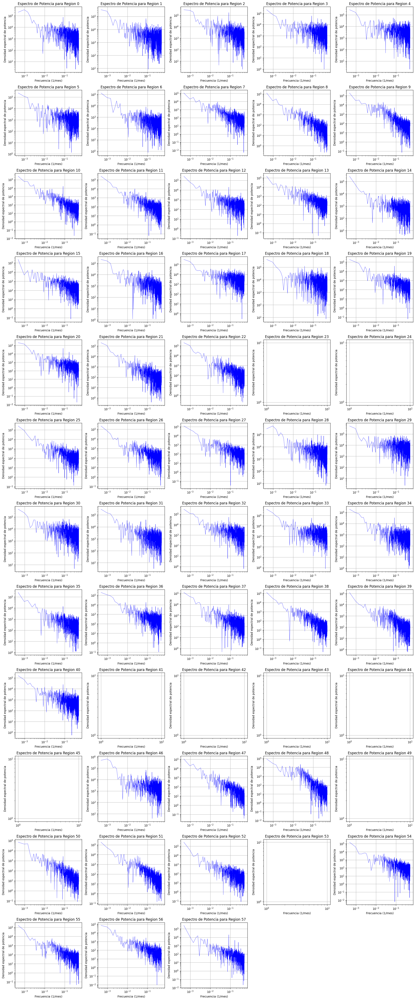

In [11]:


# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias
num_regions = len(temp_regions.columns)
total_rows = math.ceil(num_regions / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

for i, column in enumerate(temp_regions.columns, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    
    # Datos de la región actual
    region_data = temp_regions[column]
    
    # Calcular la transformada rápida de Fourier (FFT) y las frecuencias
    fft_result = np.fft.fft(region_data)
    frequencies = np.fft.fftfreq(len(region_data), d=1)  # Asume que los datos son mensuales
    
    # Calcular el espectro de potencia (magnitud al cuadrado)
    power_spectrum = np.abs(fft_result) ** 2
    
    # Graficar el espectro de potencia en escala log-log
    ax.loglog(frequencies[frequencies > 0], power_spectrum[frequencies > 0], 'b-', linewidth=0.5)  # Filtra solo frecuencias positivas

    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Espectro de Potencia para {column}')
    ax.set_xlabel('Frecuencia (1/mes)')
    ax.set_ylabel('Densidad espectral de potencia')
    ax.grid(True)

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


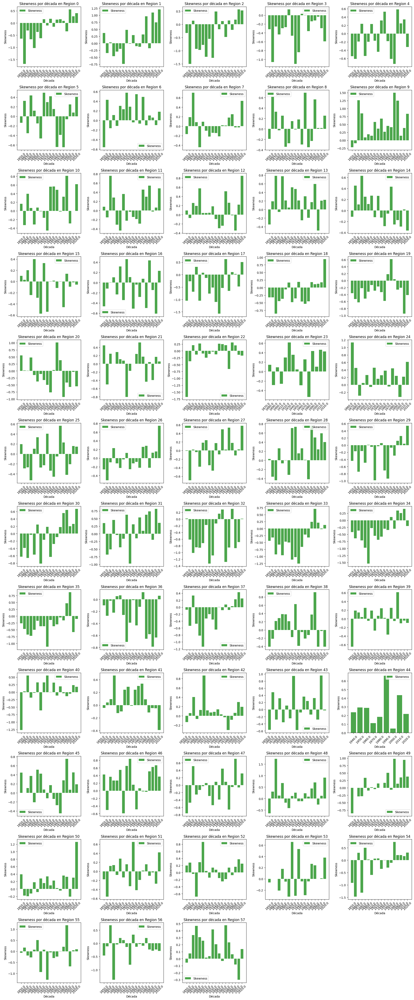

In [12]:


# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias
num_regions = len(temp_regions.columns)
total_rows = math.ceil(num_regions / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

# Calcular el skewness para cada década en cada región
for i, column in enumerate(temp_regions.columns, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    
    # Agrupar por década y calcular skewness
    # Suponemos que el índice es un DateTimeIndex, permite agrupar por década
    decades = (temp_regions.index // 10) * 10
    skewness_by_decade = temp_regions[column].groupby(decades).apply(skew)

    # Plotear el skewness por década
    ax.bar(skewness_by_decade.index.astype(str), skewness_by_decade.values, label='Skewness', color='green', alpha=0.7)
    
    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Skewness por década en {column}')
    ax.set_xlabel('Década')
    ax.set_ylabel('Skewness')
    ax.legend()
    plt.xticks(rotation=45)  # Puede ser necesario ajustar dependiendo del formato de fecha

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
[legend.py:1236 -   _parse_legend_args() ] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


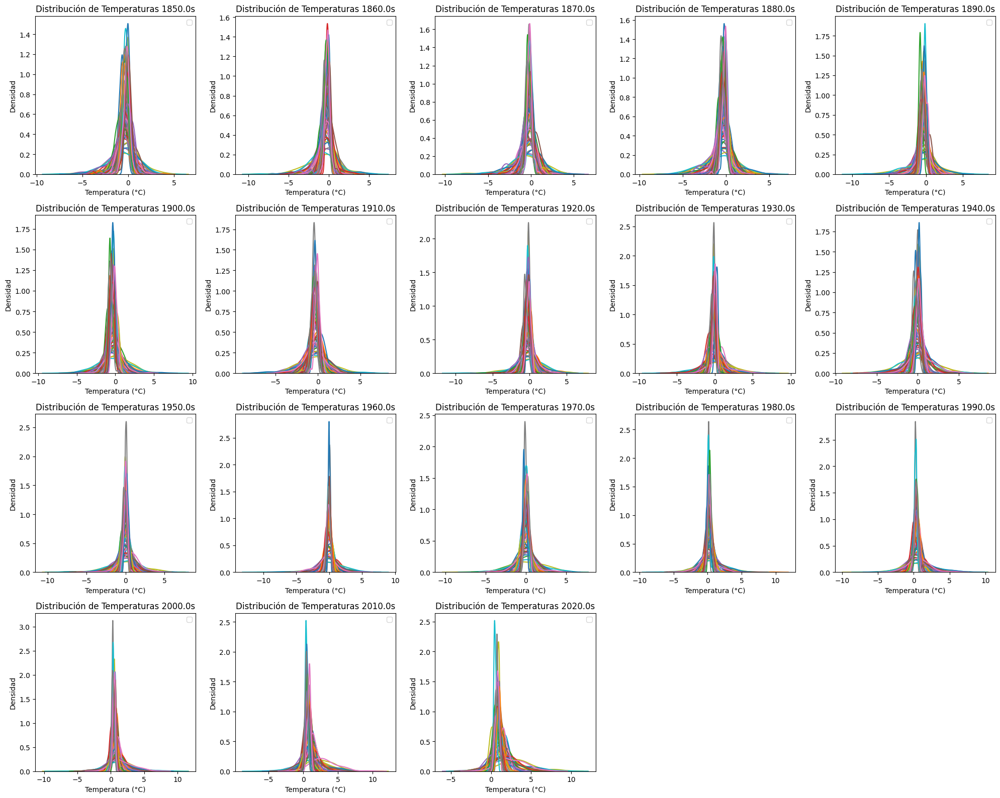

In [13]:

# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de filas necesarias para cada década
decades = (temp_regions.index // 10) * 10
unique_decades = np.unique(decades)
total_rows = math.ceil(len(unique_decades) / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))

# Iterar sobre cada década y calcular la asimetría
for i, decade in enumerate(unique_decades, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    # Filtrar los datos para la década actual
    data_decade = temp_regions[decades == decade]
    
    # Podemos usar seaborn para plotear la KDE de todas las regiones juntas
    for column in temp_regions.columns:
        sns.kdeplot(data_decade[column], ax=ax, 
                    #label=f'{column} skew: {skew(data_decade[column].dropna()):.2f}'
                    )
    
    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Distribución de Temperaturas {decade}s')
    ax.set_xlabel('Temperatura (°C)')
    ax.set_ylabel('Densidad')
    ax.legend()

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()


In [14]:

url = "https://berkeley-earth-temperature.s3.us-west-1.amazonaws.com/Global/Complete_TAVG_daily.txt"

# Hacemos la solicitud al URL
response = requests.get(url)

# Verificamos que la respuesta sea exitosa
if response.status_code == 200:
    # Convertimos el texto de la respuesta en un objeto StringIO
    data = StringIO(response.text)
    
    # Definimos los nombres de las columnas según la descripción de los datos
    column_names = ['Date Number', 'Year', 'Month', 'Day', 'Day of Year', 'Anomaly']
    
    # Utilizamos pandas para leer los datos de formato de ancho fijo
    df = pd.read_fwf(data, colspecs='infer', names=column_names, skiprows=23)  # Asumimos que las primeras 22 líneas son metadatos
    print(df.head())  # Imprimimos las primeras filas para verificar
else:
    print("Error al descargar el archivo, código de estado:", response.status_code)



   Date Number  Year  Month  Day  Day of Year  Anomaly
0     1880.001  1880      1    1            1   -0.692
1     1880.004  1880      1    2            2   -0.592
2     1880.007  1880      1    3            3   -0.673
3     1880.010  1880      1    4            4   -0.615
4     1880.012  1880      1    5            5   -0.681


In [15]:
df.head()

,Date Number,Year,Month,Day,Day of Year,Anomaly
0,1880.001,1880,1,1,1,-0.692
1,1880.004,1880,1,2,2,-0.592
2,1880.007,1880,1,3,3,-0.673
3,1880.010,1880,1,4,4,-0.615
4,1880.012,1880,1,5,5,-0.681


In [16]:

additional_years = pd.concat([df.assign(Year=df['Year'] + i) for i in range(1, 10)], ignore_index=True)

# Concatenar los datos originales con los nuevos datos
df_full = pd.concat([df, additional_years], ignore_index=True)

# Calcular la media de anomalías por año
annual_mean_anomalies = df_full.groupby('Year')['Anomaly'].mean().reset_index()

annual_mean_anomalies.head()

,Year,Anomaly
0,1880,-0.594443
1,1881,-0.464710
2,1882,-0.467628
3,1883,-0.499413
4,1884,-0.557249


In [17]:
# Crear una nueva columna con los valores del año siguiente
annual_mean_anomalies['Next Year Anomaly'] = annual_mean_anomalies['Anomaly'].shift(-1)

# Calcular la correlación entre los valores de anomalía de un año y el siguiente
correlation = annual_mean_anomalies['Anomaly'].corr(annual_mean_anomalies['Next Year Anomaly'])

annual_mean_anomalies, correlation

(     Year   Anomaly  Next Year Anomaly
 0    1880 -0.594443          -0.464710
 1    1881 -0.464710          -0.467628
 2    1882 -0.467628          -0.499413
 3    1883 -0.499413          -0.557249
 4    1884 -0.557249          -0.568041
 ..    ...       ...                ...
 147  2027  1.300362           1.347127
 148  2028  1.347127           1.354686
 149  2029  1.354686           1.282470
 150  2030  1.282470           1.359943
 151  2031  1.359943                NaN
 
 [152 rows x 3 columns],
 0.9987194771454063)

In [20]:

# Calcular la media de anomalías por mes y año
monthly_mean_anomalies = df.groupby(['Year', 'Month'])['Anomaly'].mean().reset_index()

# Añadir una columna para la década
monthly_mean_anomalies['Decade'] = (monthly_mean_anomalies['Year'] // 10) * 10

# Crear una nueva columna con los valores del mismo mes del año siguiente
# Aquí se desplaza por 12 porque hay 12 meses en un año
monthly_mean_anomalies['Next Year Same Month Anomaly'] = monthly_mean_anomalies['Anomaly'].shift(-12)

# Asegurarse de que los datos están completos para el gráfico
monthly_mean_anomalies.dropna(inplace=True)

# Calcular la correlación
correlation = monthly_mean_anomalies['Anomaly'].corr(monthly_mean_anomalies['Next Year Same Month Anomaly'])
print("Correlación entre la anomalía de un mes y el mismo mes del año siguiente:", correlation)

# Graficar con Plotly, incluyendo el año y el mes como parte de las etiquetas del hover
fig = px.scatter(monthly_mean_anomalies, x='Anomaly', y='Next Year Same Month Anomaly',
                 color='Decade',  # Usa la columna 'Decade' para colorar los puntos
                 hover_data={'Year': True, 'Month': True},  # Esto muestra el año y el mes en el hover
                 title=f'Scatter Plot de Anomalías por Mes vs. Siguiente Año Mismo Mes (Correlación: {correlation:.2f})',
                 labels={'Anomaly': 'Anomalía Promedio del Mes Actual', 'Next Year Same Month Anomaly': 'Anomalía Promedio del Mismo Mes del Año Siguiente'},
                 color_continuous_scale=px.colors.sequential.Viridis,  # Puedes cambiar la escala de colores según preferencias
                 width=800, height=600)

# Mejorar el formato del hover para mostrar los datos más claramente
fig.update_traces(marker=dict(size=10),
                  hovertemplate='Año: %{customdata[0]}<br>Mes: %{customdata[1]}<br>Anomalía Actual: %{x:.2f}<br>Anomalía del Mismo Mes Siguiente Año: %{y:.2f}')

fig.show()


Correlación entre la anomalía de un mes y el mismo mes del año siguiente: 0.7452455827013794


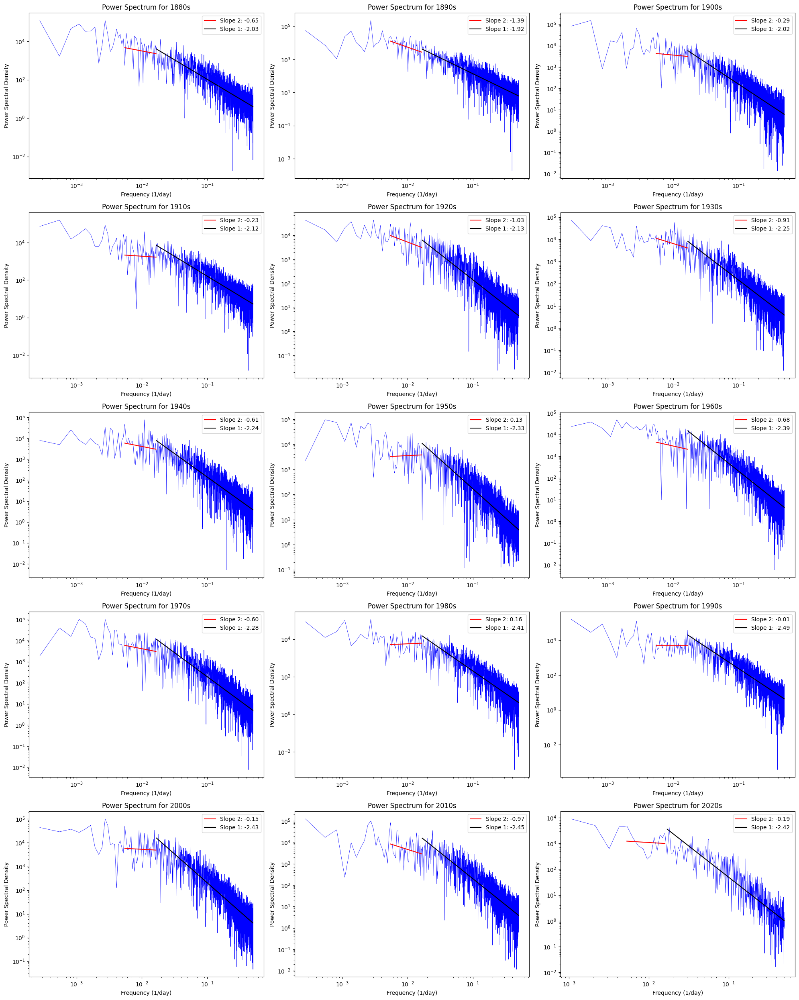

In [23]:
# Supongamos que df ya está definido y contiene la columna 'Anomaly' para cada década
df['Decade'] = (df['Year'] // 10) * 10

# Número de gráficas por fila
plots_per_row = 3

# Calcular el número total de décadas y filas necesarias
unique_decades = df['Decade'].unique()
total_rows = math.ceil(len(unique_decades) / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 5))

for i, decade in enumerate(unique_decades, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    decade_data = df[df['Decade'] == decade]['Anomaly']

    # FFT and frequencies
    fft_result = np.fft.fft(decade_data)
    frequencies = np.fft.fftfreq(len(decade_data), d=1)
    power_spectrum = np.abs(fft_result) ** 2

    # Plot power spectrum
    ax.loglog(frequencies[frequencies > 0], power_spectrum[frequencies > 0], 'b-', linewidth=0.5)

    # Analiza rangos de frecuencia
    # 1.5 to 6 months
    freq_45_days = 1 / 60
    freq_180_days = 1 / 180
    index_45_days = np.argmin(np.abs(frequencies - freq_45_days))
    index_180_days = np.argmin(np.abs(frequencies - freq_180_days))

    if index_45_days > index_180_days:
        freq_range_1 = frequencies[index_180_days:index_45_days]
        power_range_1 = power_spectrum[index_180_days:index_45_days]
        log_freq_1 = np.log10(freq_range_1[freq_range_1 > 0])
        log_power_1 = np.log10(power_range_1[freq_range_1 > 0])
        if len(log_freq_1) > 1:
            slope_1, intercept_1 = np.polyfit(log_freq_1, log_power_1, 1)
            ax.loglog(freq_range_1[freq_range_1 > 0], 10**(intercept_1 + slope_1 * log_freq_1), 'r-', label=f'Slope 2: {slope_1:.2f}')

    # 0 to 1 month
    freq_1_day = 1 / 1
    freq_30_days = 1 / 60
    index_1_day = np.argmin(np.abs(frequencies - freq_1_day))
    index_30_days = np.argmin(np.abs(frequencies - freq_30_days))

    if index_1_day > index_30_days:
        freq_range_2 = frequencies[index_30_days:index_1_day]
        power_range_2 = power_spectrum[index_30_days:index_1_day]
        log_freq_2 = np.log10(freq_range_2[freq_range_2 > 0])
        log_power_2 = np.log10(power_range_2[freq_range_2 > 0])
        if len(log_freq_2) > 1:
            slope_2, intercept_2 = np.polyfit(log_freq_2, log_power_2, 1)
            ax.loglog(freq_range_2[freq_range_2 > 0], 10**(intercept_2 + slope_2 * log_freq_2), 'k-', label=f'Slope 1: {slope_2:.2f}')

    # Nueva recta desde el final del slope 2 hasta el final del espectro
    freq_range_3 = frequencies[index_1_day:]
    power_range_3 = power_spectrum[index_1_day:]
    log_freq_3 = np.log10(freq_range_3[freq_range_3 > 0])
    log_power_3 = np.log10(power_range_3[freq_range_3 > 0])
    if len(log_freq_3) > 1:
        try:
            slope_3, intercept_3 = np.polyfit(log_freq_3, log_power_3, 1)
            ax.loglog(freq_range_3[freq_range_3 > 0], 10**(intercept_3 + slope_3 * log_freq_3), 'g-', label=f'Slope 3: {slope_3:.2f}')
        except np.linalg.LinAlgError:
            print(f"Error en el ajuste de la pendiente 3 para la década {decade}")

    # Set titles and labels
    ax.set_title(f'Power Spectrum for {decade}s')
    ax.set_xlabel('Frequency (1/day)')
    ax.set_ylabel('Power Spectral Density')
    ax.legend()

# Adjust layout
plt.tight_layout()
plt.show()

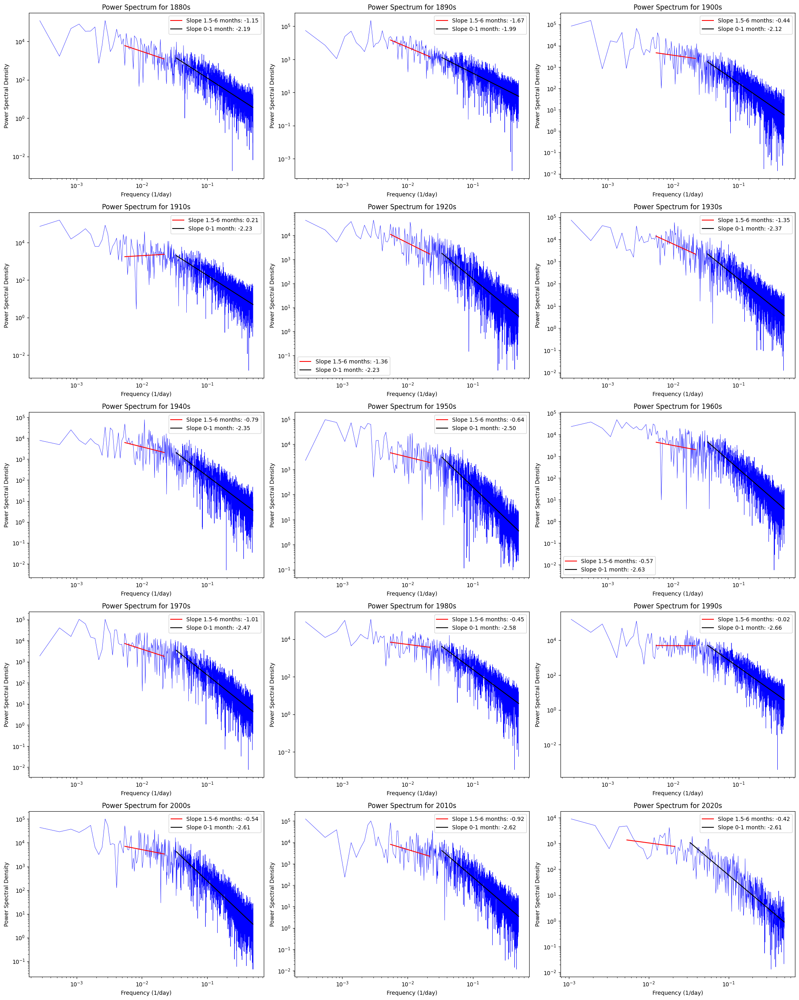

In [ ]:

# Supongamos que df ya está definido y contiene la columna 'Anomaly' para cada década
df['Decade'] = (df['Year'] // 10) * 10

# Número de gráficas por fila
plots_per_row = 3

# Calcular el número total de décadas y filas necesarias
unique_decades = df['Decade'].unique()
total_rows = math.ceil(len(unique_decades) / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 5))

for i, decade in enumerate(unique_decades, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    decade_data = df[df['Decade'] == decade]['Anomaly']
    
    # FFT and frequencies
    fft_result = np.fft.fft(decade_data)
    frequencies = np.fft.fftfreq(len(decade_data), d=1)
    power_spectrum = np.abs(fft_result) ** 2
    
    # Guardar los datos de frecuencia y espectro de potencia en un CSV
    frequency_data = pd.DataFrame({
        'Frequency': frequencies,
        'PowerSpectrum': power_spectrum
    })
    #frequency_data.to_csv(f'frequency_data_{decade}s.csv', index=False)

    # Plot power spectrum
    ax.loglog(frequencies[frequencies > 0], power_spectrum[frequencies > 0], 'b-', linewidth=0.5)

    # Analiza rangos de frecuencia
    
    # 1.5 to 6 months
    freq_45_days = 1 / 45
    freq_180_days = 1 / 180
    index_45_days = np.argmin(np.abs(frequencies - freq_45_days))
    index_180_days = np.argmin(np.abs(frequencies - freq_180_days))
    
    if index_45_days > index_180_days:
        freq_range_1 = frequencies[index_180_days:index_45_days]
        power_range_1 = power_spectrum[index_180_days:index_45_days]
        log_freq_1 = np.log10(freq_range_1)
        log_power_1 = np.log10(power_range_1)
        slope_1, intercept_1 = np.polyfit(log_freq_1, log_power_1, 1)
        ax.loglog(freq_range_1, 10**(intercept_1 + slope_1 * log_freq_1), 'r-', label=f'Slope 1.5-6 months: {slope_1:.2f}')

    # 0 to 1 month
    freq_1_day = 1 / 1
    freq_30_days = 1 / 30
    index_1_day = np.argmin(np.abs(frequencies - freq_1_day))
    index_30_days = np.argmin(np.abs(frequencies - freq_30_days))
    
    if index_1_day > index_30_days:
        freq_range_2 = frequencies[index_30_days:index_1_day]
        power_range_2 = power_spectrum[index_30_days:index_1_day]
        log_freq_2 = np.log10(freq_range_2)
        log_power_2 = np.log10(power_range_2)
        slope_2, intercept_2 = np.polyfit(log_freq_2, log_power_2, 1)
        
        ax.loglog(freq_range_2, 10**(intercept_2 + slope_2 * log_freq_2), 'k-', label=f'Slope 0-1 month: {slope_2:.2f}')

    # Set titles and labels
    ax.set_title(f'Power Spectrum for {decade}s')
    ax.set_xlabel('Frequency (1/day)')
    ax.set_ylabel('Power Spectral Density')
    ax.legend()

# Adjust layout
plt.tight_layout()
plt.show()



C:\Users\danie\AppData\Local\Temp\ipykernel_27592\945533194.py:53: UserWarning:

linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "ro-" (-> linestyle='-'). The keyword argument will take precedence.

C:\Users\danie\AppData\Local\Temp\ipykernel_27592\945533194.py:54: UserWarning:

linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "ko-" (-> linestyle='-'). The keyword argument will take precedence.



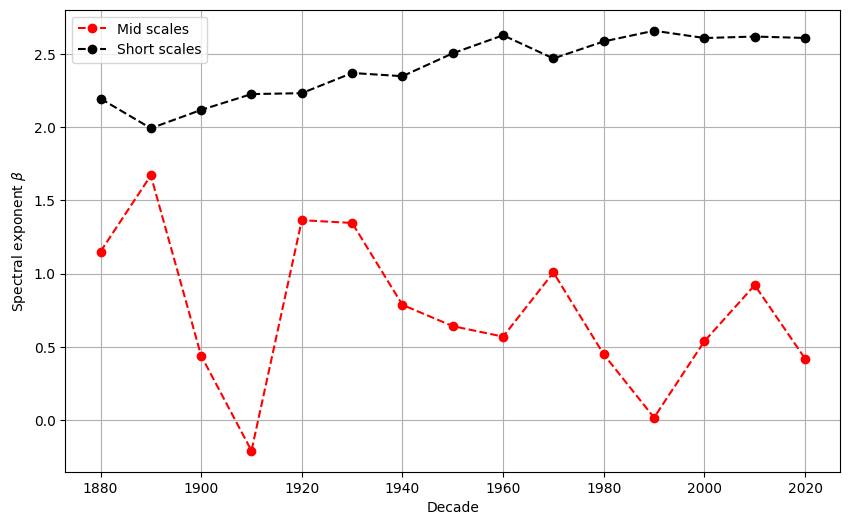

In [ ]:

# Calcular la década para cada registro
df['Decade'] = (df['Year'] // 10) * 10

# Calcular los exponentes espectrales para diferentes escalas temporales
decades = df['Decade'].unique()
short_scales = []
mid_scales = []

for decade in decades:
    decade_data = df[df['Decade'] == decade]['Anomaly']
    
    # FFT y frecuencias
    fft_result = np.fft.fft(decade_data)
    frequencies = np.fft.fftfreq(len(decade_data), d=1)
    power_spectrum = np.abs(fft_result) ** 2
    
    # Escalas cortas (0 a 1 mes)
    freq_1_day = 1 / 1
    freq_30_days = 1 / 30
    index_1_day = np.argmin(np.abs(frequencies - freq_1_day))
    index_30_days = np.argmin(np.abs(frequencies - freq_30_days))
    
    if index_1_day > index_30_days:
        freq_range_2 = frequencies[index_30_days:index_1_day]
        power_range_2 = power_spectrum[index_30_days:index_1_day]
        log_freq_2 = np.log10(freq_range_2)
        log_power_2 = np.log10(power_range_2)
        slope_2, intercept_2 = np.polyfit(log_freq_2, log_power_2, 1)
        short_scales.append(-slope_2)  # Cambiar el signo de la pendiente
    
    # Escalas medias (1.5 a 6 meses)
    freq_45_days = 1 / 45
    freq_180_days = 1 / 180
    index_45_days = np.argmin(np.abs(frequencies - freq_45_days))
    index_180_days = np.argmin(np.abs(frequencies - freq_180_days))
    
    if index_45_days > index_180_days:
        freq_range_1 = frequencies[index_180_days:index_45_days]
        power_range_1 = power_spectrum[index_180_days:index_45_days]
        log_freq_1 = np.log10(freq_range_1)
        log_power_1 = np.log10(power_range_1)
        slope_1, intercept_1 = np.polyfit(log_freq_1, log_power_1, 1)
        mid_scales.append(-slope_1)  # Cambiar el signo de la pendiente

# Crear el gráfico final
plt.figure(figsize=(10, 6))
plt.plot(decades, mid_scales, 'ro-', label='Mid scales', linestyle='--')
plt.plot(decades, short_scales, 'ko-', label='Short scales', linestyle='--')

plt.xlabel('Decade')
plt.ylabel(r'Spectral exponent $\beta$')
plt.legend()
plt.grid(True)
plt.show()


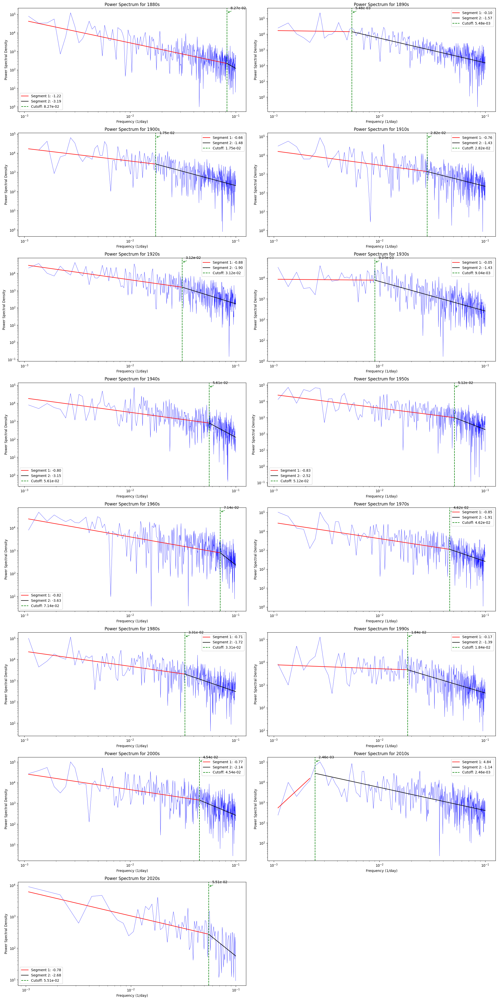

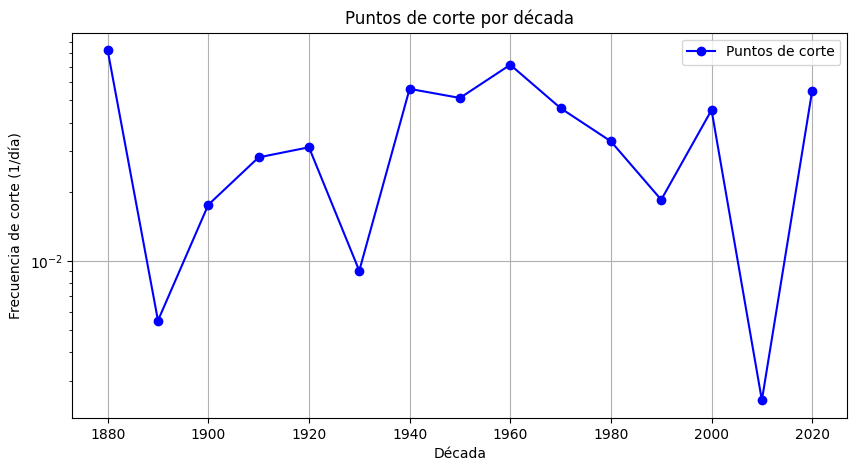

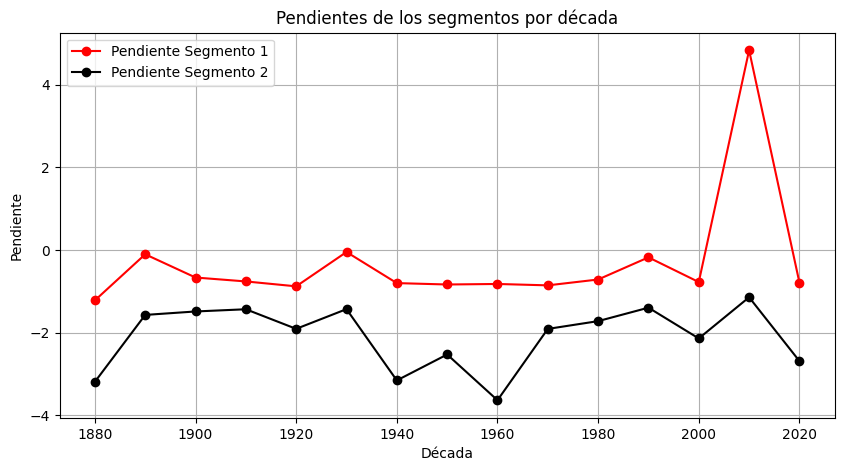

In [ ]:



# Supongamos que df ya está definido y contiene la columna 'Anomaly' para cada década
df['Decade'] = (df['Year'] // 10) * 10

# Número de gráficas por fila
plots_per_row = 3

# Calcular el número total de décadas y filas necesarias
unique_decades = df['Decade'].unique()
total_rows = math.ceil(len(unique_decades) / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 5))

cutoff_points = []  # Lista para almacenar los puntos de corte
slopes_segment_1 = []  # Lista para almacenar las pendientes del segmento 1
slopes_segment_2 = []  # Lista para almacenar las pendientes del segmento 2

for i, decade in enumerate(unique_decades, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    decade_data = df[df['Decade'] == decade]['Anomaly']
    
    # FFT and frequencies
    fft_result = np.fft.fft(decade_data)
    frequencies = np.fft.fftfreq(len(decade_data), d=1)
    power_spectrum = np.abs(fft_result) ** 2
    
    # Filtrar frecuencias y espectros de potencia nulos o infinitos
    valid_indices = np.isfinite(frequencies) & np.isfinite(power_spectrum) & (frequencies > 0)
    frequencies = frequencies[valid_indices]
    power_spectrum = power_spectrum[valid_indices]

    # Limitar el rango de frecuencias a 10^-1 a 10^-3
    range_indices = (frequencies >= 10**-3) & (frequencies <= 10**-1)
    frequencies = frequencies[range_indices]
    power_spectrum = power_spectrum[range_indices]

    # Asegurar que las longitudes coincidan
    min_length = min(len(frequencies), len(power_spectrum))
    frequencies = frequencies[:min_length]
    power_spectrum = power_spectrum[:min_length]

    # Plot power spectrum
    ax.loglog(frequencies, power_spectrum, 'b-', linewidth=0.5)

    # Aplicar regresión segmentada usando pwlf
    log_freq = np.log10(frequencies)
    log_power = np.log10(power_spectrum)

    # Ajustar el modelo piecewise
    pwlf_model = pwlf.PiecewiseLinFit(log_freq, log_power)
    breaks = pwlf_model.fit(2)  # 2 segmentos

    # Obtener el punto de cambio
    optimal_cutoff_log = breaks[1]
    optimal_cutoff = 10**optimal_cutoff_log
    index_cutoff = np.argmin(np.abs(frequencies - optimal_cutoff))

    # Obtener las pendientes de cada segmento
    slope_segment_1 = pwlf_model.slopes[0]
    slope_segment_2 = pwlf_model.slopes[1]
    slopes_segment_1.append(slope_segment_1)
    slopes_segment_2.append(slope_segment_2)

    # Graficar las líneas de regresión ajustadas
    pred_power_1 = 10**pwlf_model.predict(log_freq[:index_cutoff])
    pred_power_2 = 10**pwlf_model.predict(log_freq[index_cutoff:])
    ax.loglog(frequencies[:index_cutoff], pred_power_1, 'r-', label=f'Segment 1: {slope_segment_1:.2f}')
    ax.loglog(frequencies[index_cutoff:], pred_power_2, 'k-', label=f'Segment 2: {slope_segment_2:.2f}')

    # Marcar el punto de corte en el eje x
    ax.axvline(optimal_cutoff, color='g', linestyle='--', label=f'Cutoff: {optimal_cutoff:.2e}')
    ax.annotate(f'{optimal_cutoff:.2e}', xy=(optimal_cutoff, max(power_spectrum)), xytext=(10, 10),
                textcoords='offset points', arrowprops=dict(arrowstyle='->', color='green'))

    # Almacenar el punto de corte para esta década
    cutoff_points.append(optimal_cutoff)

    # Set titles and labels
    ax.set_title(f'Power Spectrum for {decade}s')
    ax.set_xlabel('Frequency (1/day)')
    ax.set_ylabel('Power Spectral Density')
    ax.legend()

# Adjust layout
plt.tight_layout()
plt.show()

# Crear una gráfica de los puntos de corte por década
plt.figure(figsize=(10, 5))
plt.plot(unique_decades, cutoff_points, 'o-', color='b', label='Puntos de corte')
plt.xlabel('Década')
plt.ylabel('Frecuencia de corte (1/día)')
plt.title('Puntos de corte por década')
plt.yscale('log')
plt.legend()
plt.grid(True)
plt.show()

# Crear una gráfica de las pendientes de los segmentos por década
plt.figure(figsize=(10, 5))
plt.plot(unique_decades, slopes_segment_1, 'o-', color='r', label='Pendiente Segmento 1')
plt.plot(unique_decades, slopes_segment_2, 'o-', color='k', label='Pendiente Segmento 2')
plt.xlabel('Década')
plt.ylabel('Pendiente')
plt.title('Pendientes de los segmentos por década')
plt.legend()
plt.grid(True)
plt.show()


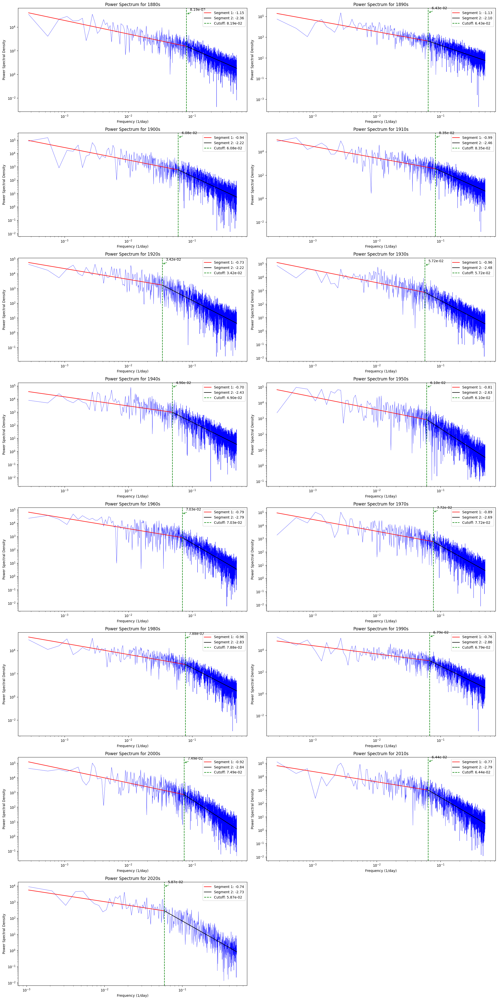

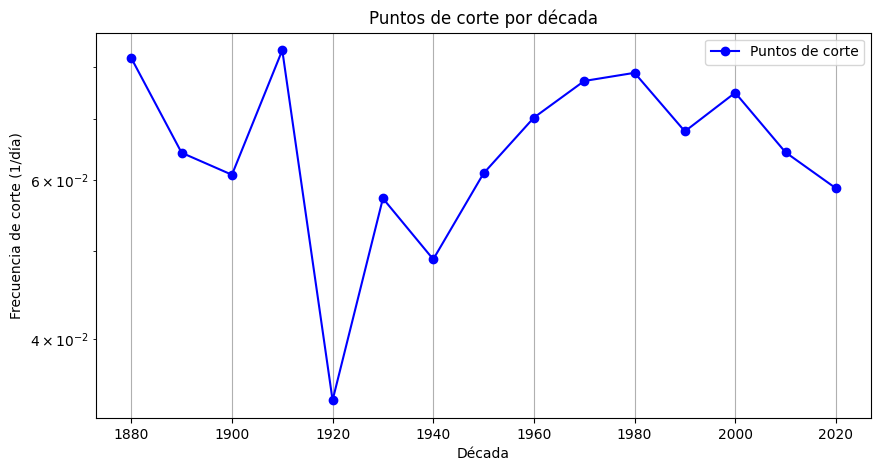

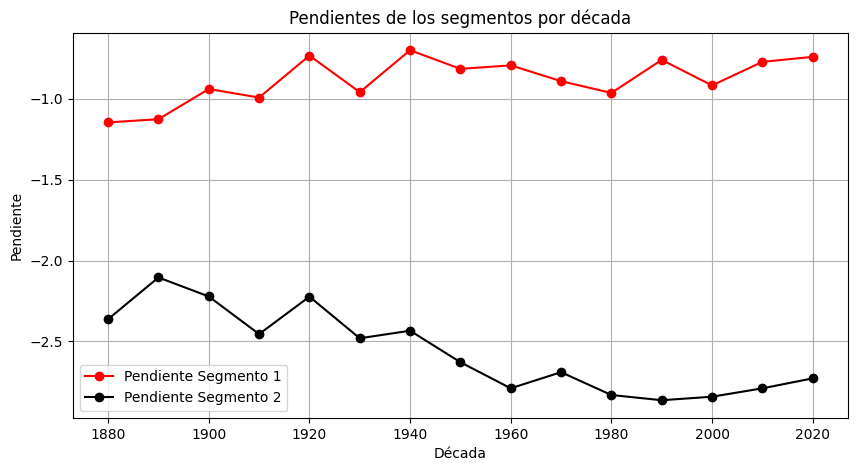

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import pwlf

# Supongamos que df ya está definido y contiene la columna 'Anomaly' para cada década
df['Decade'] = (df['Year'] // 10) * 10

# Número de gráficas por fila
plots_per_row = 2

# Calcular el número total de décadas y filas necesarias
unique_decades = df['Decade'].unique()
total_rows = math.ceil(len(unique_decades) / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 5))

cutoff_points = []  # Lista para almacenar los puntos de corte
slopes_segment_1 = []  # Lista para almacenar las pendientes del segmento 1
slopes_segment_2 = []  # Lista para almacenar las pendientes del segmento 2

for i, decade in enumerate(unique_decades, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    decade_data = df[df['Decade'] == decade]['Anomaly']
    
    # FFT and frequencies
    fft_result = np.fft.fft(decade_data)
    frequencies = np.fft.fftfreq(len(decade_data), d=1)
    power_spectrum = np.abs(fft_result) ** 2
    
    # Filtrar frecuencias y espectros de potencia nulos o infinitos
    valid_indices = np.isfinite(frequencies) & np.isfinite(power_spectrum) & (frequencies > 0)
    frequencies = frequencies[valid_indices]
    power_spectrum = power_spectrum[valid_indices]

    # Asegurar que las longitudes coincidan
    min_length = min(len(frequencies), len(power_spectrum))
    frequencies = frequencies[:min_length]
    power_spectrum = power_spectrum[:min_length]

    # Plot power spectrum
    ax.loglog(frequencies, power_spectrum, 'b-', linewidth=0.5)

    # Aplicar regresión segmentada usando pwlf
    log_freq = np.log10(frequencies)
    log_power = np.log10(power_spectrum)

    # Ajustar el modelo piecewise
    pwlf_model = pwlf.PiecewiseLinFit(log_freq, log_power)
    breaks = pwlf_model.fit(2)  # 2 segmentos

    # Obtener el punto de cambio
    optimal_cutoff_log = breaks[1]
    optimal_cutoff = 10**optimal_cutoff_log
    index_cutoff = np.argmin(np.abs(frequencies - optimal_cutoff))

    # Obtener las pendientes de cada segmento
    slope_segment_1 = pwlf_model.slopes[0]
    slope_segment_2 = pwlf_model.slopes[1]
    slopes_segment_1.append(slope_segment_1)
    slopes_segment_2.append(slope_segment_2)

    # Graficar las líneas de regresión ajustadas
    pred_power_1 = 10**pwlf_model.predict(log_freq[:index_cutoff])
    pred_power_2 = 10**pwlf_model.predict(log_freq[index_cutoff:])
    ax.loglog(frequencies[:index_cutoff], pred_power_1, 'r-', label=f'Segment 1: {slope_segment_1:.2f}')
    ax.loglog(frequencies[index_cutoff:], pred_power_2, 'k-', label=f'Segment 2: {slope_segment_2:.2f}')

    # Marcar el punto de corte en el eje x
    ax.axvline(optimal_cutoff, color='g', linestyle='--', label=f'Cutoff: {optimal_cutoff:.2e}')
    ax.annotate(f'{optimal_cutoff:.2e}', xy=(optimal_cutoff, max(power_spectrum)), xytext=(10, 10),
                textcoords='offset points', arrowprops=dict(arrowstyle='->', color='green'))

    # Almacenar el punto de corte para esta década
    cutoff_points.append(optimal_cutoff)

    # Set titles and labels
    ax.set_title(f'Power Spectrum for {decade}s')
    ax.set_xlabel('Frequency (1/day)')
    ax.set_ylabel('Power Spectral Density')
    ax.legend()

# Adjust layout
plt.tight_layout()
plt.show()

# Crear una gráfica de los puntos de corte por década
plt.figure(figsize=(10, 5))
plt.plot(unique_decades, cutoff_points, 'o-', color='b', label='Puntos de corte')
plt.xlabel('Década')
plt.ylabel('Frecuencia de corte (1/día)')
plt.title('Puntos de corte por década')
plt.yscale('log')
plt.legend()
plt.grid(True)
plt.show()

# Crear una gráfica de las pendientes de los segmentos por década
plt.figure(figsize=(10, 5))
plt.plot(unique_decades, slopes_segment_1, 'o-', color='r', label='Pendiente Segmento 1')
plt.plot(unique_decades, slopes_segment_2, 'o-', color='k', label='Pendiente Segmento 2')
plt.xlabel('Década')
plt.ylabel('Pendiente')
plt.title('Pendientes de los segmentos por década')
plt.legend()
plt.grid(True)
plt.show()


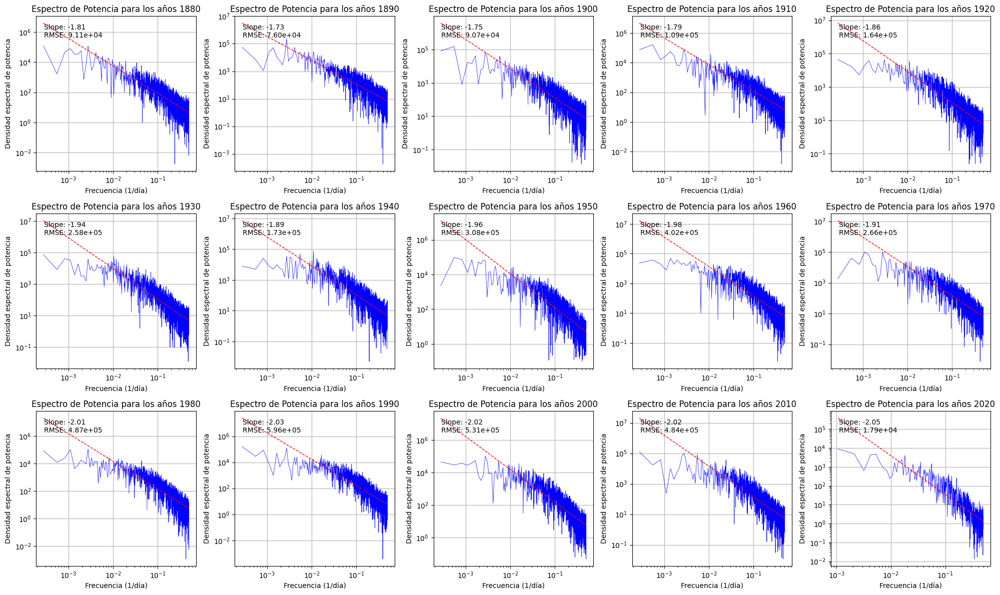

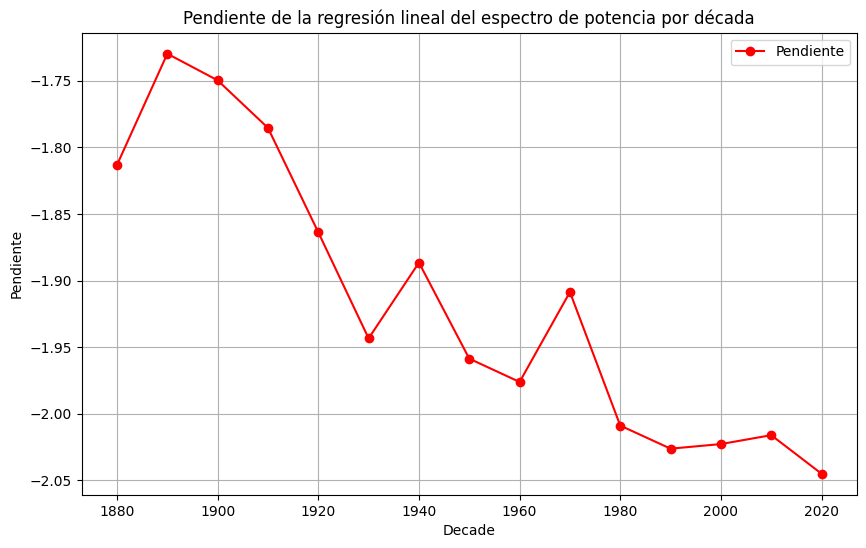

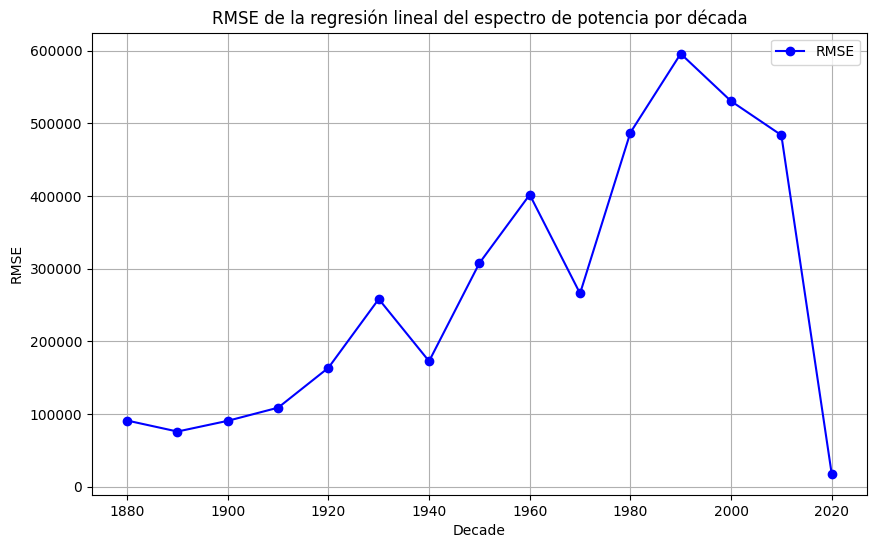

In [ ]:
from scipy.stats import linregress



# Agrupar los datos por décadas
df['Decade'] = (df['Year'] // 10) * 10  # Crea una nueva columna para la década

# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de décadas y filas necesarias
unique_decades = np.sort(df['Decade'].unique())
total_rows = math.ceil(len(unique_decades) / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

# Lista para almacenar las pendientes y los RMSE
slopes = []
rmses = []

for i, decade in enumerate(unique_decades, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    decade_data = df[df['Decade'] == decade]['Anomaly']
    
    # Calcular la transformada rápida de Fourier (FFT) y las frecuencias
    fft_result = np.fft.fft(decade_data)
    frequencies = np.fft.fftfreq(len(decade_data), d=1)  # d=1 asumiendo datos diarios
    
    # Calcular el espectro de potencia (magnitud al cuadrado)
    power_spectrum = np.abs(fft_result) ** 2
    
    # Filtrar solo frecuencias positivas
    positive_frequencies = frequencies[frequencies > 0]
    positive_power_spectrum = power_spectrum[frequencies > 0]
    
    # Graficar el espectro de potencia en escala log-log
    ax.loglog(positive_frequencies, positive_power_spectrum, 'b-', linewidth=0.5)
    
    # Aplicar la regresión lineal en el espacio log-log
    log_frequencies = np.log10(positive_frequencies)
    log_power_spectrum = np.log10(positive_power_spectrum)
    
    slope, intercept, r_value, p_value, std_err = linregress(log_frequencies, log_power_spectrum)
    
    # Calcular los valores ajustados
    predicted_log_power_spectrum = intercept + slope * log_frequencies
    predicted_power_spectrum = 10**predicted_log_power_spectrum
    
    # Calcular el RMSE
    rmse = np.sqrt(np.mean((positive_power_spectrum - predicted_power_spectrum) ** 2))
    rmses.append(rmse)
    
    # Graficar la línea de regresión
    ax.loglog(positive_frequencies, 10**predicted_log_power_spectrum, 'r--', linewidth=1)

    # Mostrar la pendiente y el RMSE en el gráfico
    ax.text(0.05, 0.95, f'Slope: {slope:.2f}\nRMSE: {rmse:.2e}', transform=ax.transAxes, fontsize=10, verticalalignment='top')

    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Espectro de Potencia para los años {decade}')
    ax.set_xlabel('Frecuencia (1/día)')
    ax.set_ylabel('Densidad espectral de potencia')
    ax.grid(True)
    
    # Almacenar la pendiente
    slopes.append(slope)

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()

# Graficar la pendiente de la regresión lineal para cada década
plt.figure(figsize=(10, 6))
plt.plot(unique_decades, slopes, 'o-', color='red', label='Pendiente')
plt.xlabel('Decade')
plt.ylabel('Pendiente')
plt.title('Pendiente de la regresión lineal del espectro de potencia por década')
plt.grid(True)
plt.legend()
plt.show()

# Graficar el RMSE de la regresión lineal para cada década
plt.figure(figsize=(10, 6))
plt.plot(unique_decades, rmses, 'o-', color='blue', label='RMSE')
plt.xlabel('Decade')
plt.ylabel('RMSE')
plt.title('RMSE de la regresión lineal del espectro de potencia por década')
plt.grid(True)
plt.legend()
plt.show()


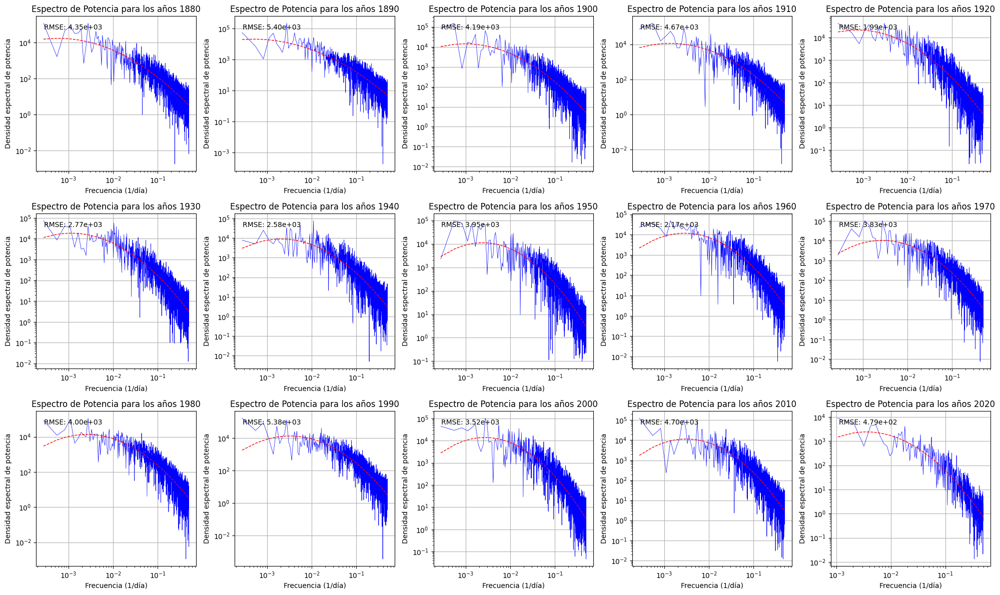

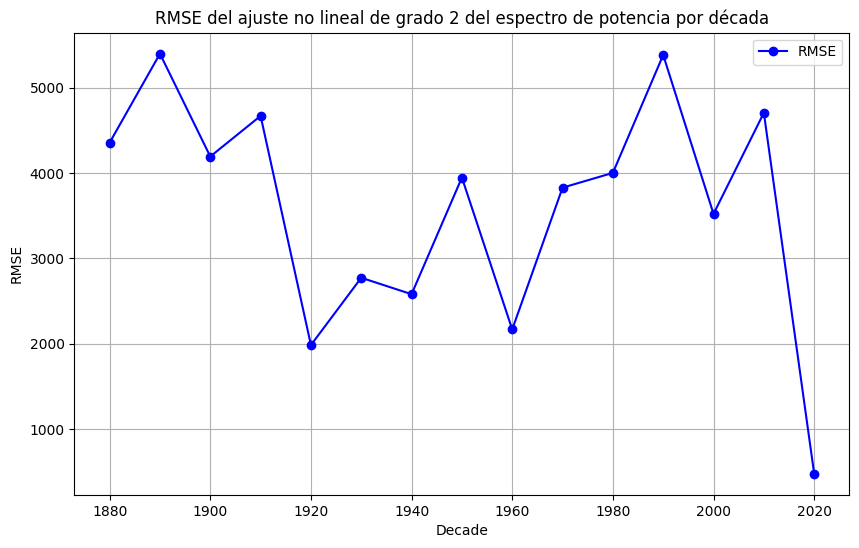

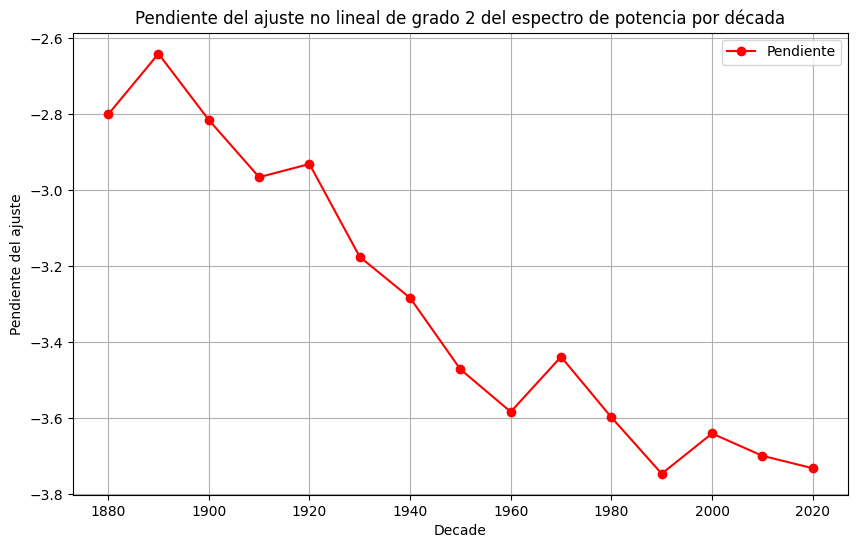

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.stats import linregress

# Agrupar los datos por décadas
df['Decade'] = (df['Year'] // 10) * 10  # Crea una nueva columna para la década

# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de décadas y filas necesarias
unique_decades = np.sort(df['Decade'].unique())
total_rows = math.ceil(len(unique_decades) / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

# Lista para almacenar los RMSE y las pendientes
rmses = []
coefficients_list = []

for i, decade in enumerate(unique_decades, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    decade_data = df[df['Decade'] == decade]['Anomaly']
    
    # Calcular la transformada rápida de Fourier (FFT) y las frecuencias
    fft_result = np.fft.fft(decade_data)
    frequencies = np.fft.fftfreq(len(decade_data), d=1)  # d=1 asumiendo datos diarios
    
    # Calcular el espectro de potencia (magnitud al cuadrado)
    power_spectrum = np.abs(fft_result) ** 2
    
    # Filtrar solo frecuencias positivas
    positive_frequencies = frequencies[frequencies > 0]
    positive_power_spectrum = power_spectrum[frequencies > 0]
    
    # Graficar el espectro de potencia en escala log-log
    ax.loglog(positive_frequencies, positive_power_spectrum, 'b-', linewidth=0.5)
    
    # Ajustar un polinomio de grado 2 en el espacio log-log
    log_frequencies = np.log10(positive_frequencies)
    log_power_spectrum = np.log10(positive_power_spectrum)
    
    poly_coefficients = np.polyfit(log_frequencies, log_power_spectrum, 2)
    poly_fit = np.poly1d(poly_coefficients)
    fit_values = poly_fit(log_frequencies)
    
    # Calcular los valores ajustados
    predicted_power_spectrum = 10**fit_values
    
    # Calcular el RMSE
    rmse = np.sqrt(np.mean((positive_power_spectrum - predicted_power_spectrum) ** 2))
    rmses.append(rmse)
    coefficients_list.append(poly_coefficients)
    
    # Graficar la curva de ajuste no lineal
    ax.loglog(positive_frequencies, predicted_power_spectrum, 'r--', linewidth=1)

    # Mostrar el RMSE en el gráfico
    ax.text(0.05, 0.95, f'RMSE: {rmse:.2e}', transform=ax.transAxes, fontsize=10, verticalalignment='top')

    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Espectro de Potencia para los años {decade}')
    ax.set_xlabel('Frecuencia (1/día)')
    ax.set_ylabel('Densidad espectral de potencia')
    ax.grid(True)

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()

# Graficar el RMSE del ajuste no lineal de grado 2 para cada década
plt.figure(figsize=(10, 6))
plt.plot(unique_decades, rmses, 'o-', color='blue', label='RMSE')
plt.xlabel('Decade')
plt.ylabel('RMSE')
plt.title('RMSE del ajuste no lineal de grado 2 del espectro de potencia por década')
plt.grid(True)
plt.legend()
plt.show()

# Mostrar las pendientes (coeficientes del polinomio) para cada década
slopes_2 = [coeff[1] for coeff in coefficients_list]
plt.figure(figsize=(10, 6))
plt.plot(unique_decades, slopes_2, 'o-', color='red', label='Pendiente')
plt.xlabel('Decade')
plt.ylabel('Pendiente del ajuste')
plt.title('Pendiente del ajuste no lineal de grado 2 del espectro de potencia por década')
plt.grid(True)
plt.legend()
plt.show()


<Figure size 2000x1200 with 0 Axes>

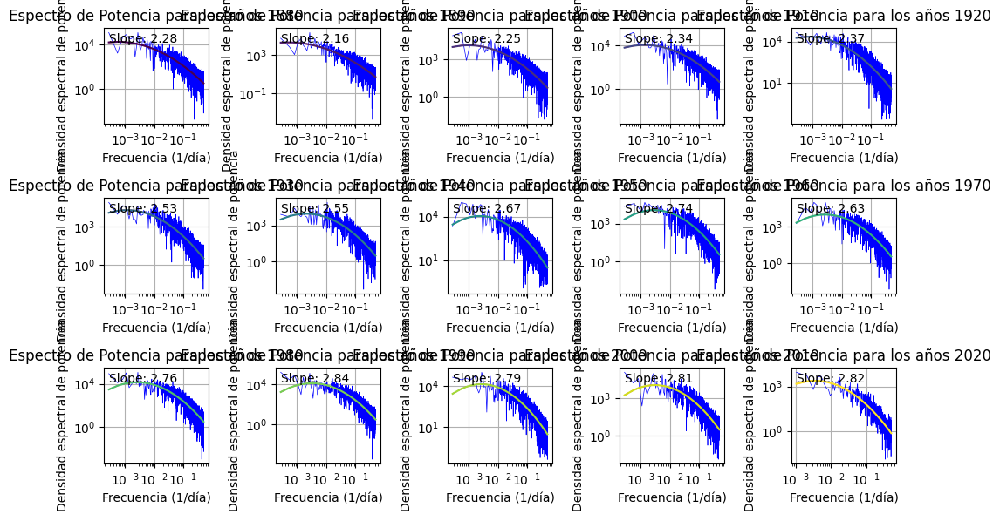

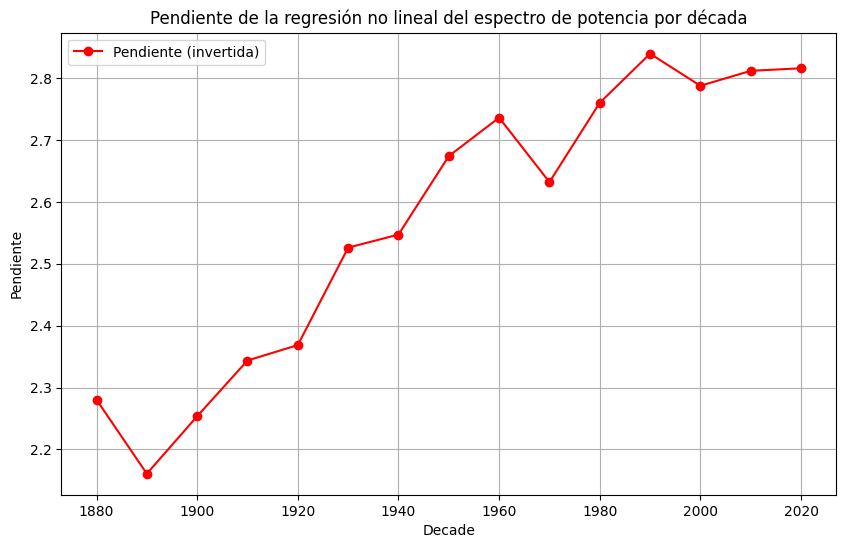

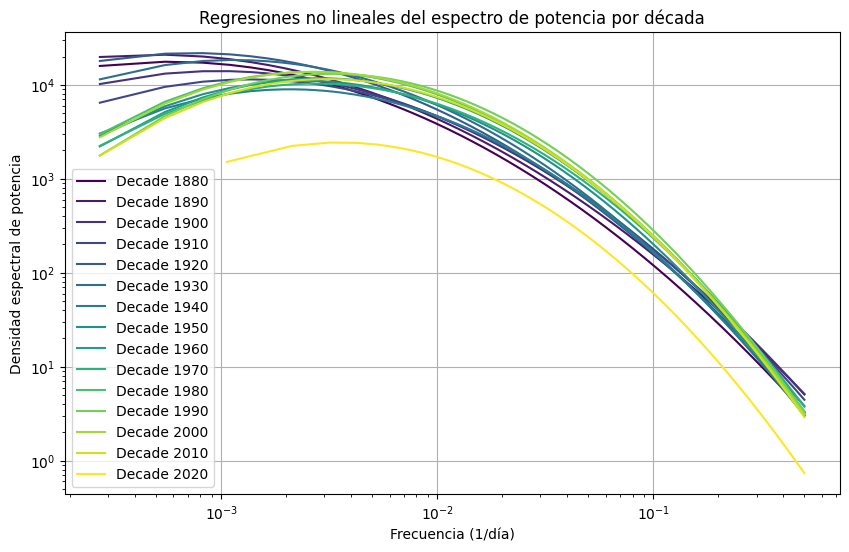

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.stats import linregress
import matplotlib.cm as cm

# Agrupar los datos por décadas
df['Decade'] = (df['Year'] // 10) * 10  # Crea una nueva columna para la década

# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de décadas y filas necesarias
unique_decades = np.sort(df['Decade'].unique())
total_rows = math.ceil(len(unique_decades) / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

# Lista para almacenar las pendientes
slopes = []

# Crear una figura para todas las regresiones
plt.figure(figsize=(10, 6))

# Crear un colormap
colors = cm.viridis(np.linspace(0, 1, len(unique_decades)))

for i, (decade, color) in enumerate(zip(unique_decades, colors), start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    decade_data = df[df['Decade'] == decade]['Anomaly']
    
    # Calcular la transformada rápida de Fourier (FFT) y las frecuencias
    fft_result = np.fft.fft(decade_data)
    frequencies = np.fft.fftfreq(len(decade_data), d=1)  # d=1 asumiendo datos diarios
    
    # Calcular el espectro de potencia (magnitud al cuadrado)
    power_spectrum = np.abs(fft_result) ** 2
    
    # Filtrar solo frecuencias positivas
    positive_frequencies = frequencies[frequencies > 0]
    positive_power_spectrum = power_spectrum[frequencies > 0]
    
    # Graficar el espectro de potencia en escala log-log
    ax.loglog(positive_frequencies, positive_power_spectrum, 'b-', linewidth=0.5)
    
    # Aplicar una regresión no lineal de grado 2 en el espacio log-log
    log_frequencies = np.log10(positive_frequencies)
    log_power_spectrum = np.log10(positive_power_spectrum)
    
    poly_coefficients = np.polyfit(log_frequencies, log_power_spectrum, 2)
    poly_fit = np.poly1d(poly_coefficients)
    fit_values = poly_fit(log_frequencies)
    
    # Graficar la curva de ajuste no lineal
    ax.loglog(positive_frequencies, 10**fit_values, 'r--', linewidth=1)
    
    # Calcular la derivada del polinomio ajustado
    poly_derivative = np.polyder(poly_fit)
    
    # Evaluar la derivada en el punto medio de log_frequencies
    mid_point = np.median(log_frequencies)
    slope = -poly_derivative(mid_point)
    
    # Mostrar la pendiente en el gráfico
    ax.text(0.05, 0.95, f'Slope: {slope:.2f}', transform=ax.transAxes, fontsize=10, verticalalignment='top')

    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Espectro de Potencia para los años {decade}')
    ax.set_xlabel('Frecuencia (1/día)')
    ax.set_ylabel('Densidad espectral de potencia')
    ax.grid(True)
    
    # Almacenar la pendiente
    slopes.append(slope)

    # Añadir la curva de ajuste no lineal a la figura de todas las regresiones
    plt.loglog(positive_frequencies, 10**fit_values, color=color, label=f'Decade {decade}')

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()

# Graficar la pendiente de la regresión no lineal para cada década
plt.figure(figsize=(10, 6))
plt.plot(unique_decades, slopes, 'o-', color='red', label='Pendiente (invertida)')
plt.xlabel('Decade')
plt.ylabel('Pendiente')
plt.title('Pendiente de la regresión no lineal del espectro de potencia por década')
plt.grid(True)
plt.legend()
plt.show()

# Mostrar todas las regresiones en una sola gráfica con escala de colores
plt.figure(figsize=(10, 6))
for i, (decade, color) in enumerate(zip(unique_decades, colors), start=1):
    decade_data = df[df['Decade'] == decade]['Anomaly']
    
    # Calcular la transformada rápida de Fourier (FFT) y las frecuencias
    fft_result = np.fft.fft(decade_data)
    frequencies = np.fft.fftfreq(len(decade_data), d=1)  # d=1 asumiendo datos diarios
    
    # Calcular el espectro de potencia (magnitud al cuadrado)
    power_spectrum = np.abs(fft_result) ** 2
    
    # Filtrar solo frecuencias positivas
    positive_frequencies = frequencies[frequencies > 0]
    positive_power_spectrum = power_spectrum[frequencies > 0]
    
    # Aplicar una regresión no lineal de grado 2 en el espacio log-log
    log_frequencies = np.log10(positive_frequencies)
    log_power_spectrum = np.log10(positive_power_spectrum)
    
    poly_coefficients = np.polyfit(log_frequencies, log_power_spectrum, 2)
    poly_fit = np.poly1d(poly_coefficients)
    fit_values = poly_fit(log_frequencies)
    
    # Añadir la curva de ajuste no lineal a la figura de todas las regresiones
    plt.loglog(positive_frequencies, 10**fit_values, color=color, label=f'Decade {decade}')

plt.xlabel('Frecuencia (1/día)')
plt.ylabel('Densidad espectral de potencia')
plt.title('Regresiones no lineales del espectro de potencia por década')
plt.grid(True)
plt.legend()
plt.show()


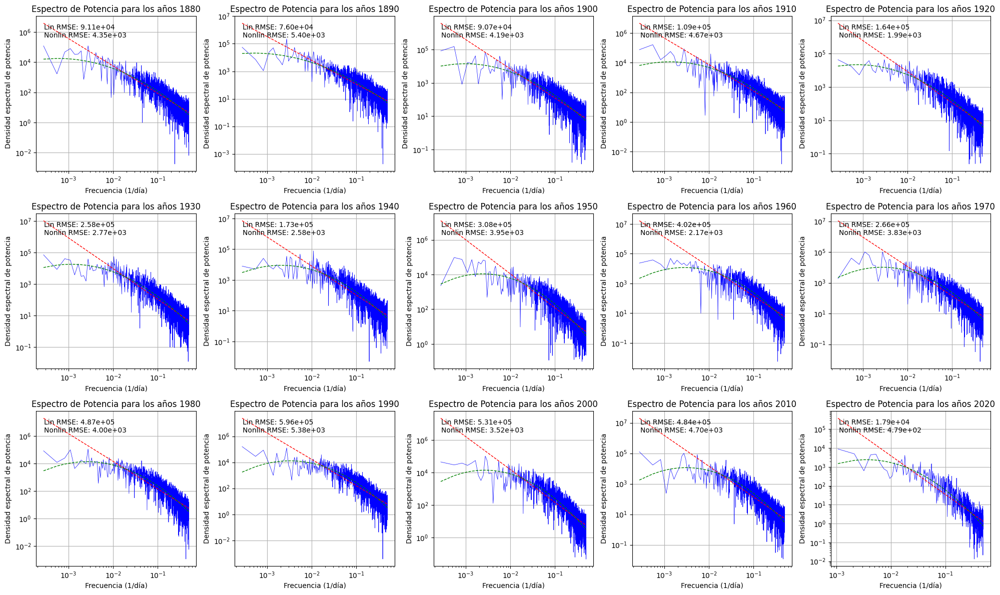

    Decade  Linear Slope  Linear Intercept    Linear RMSE  Nonlinear Coeff a2  \
0     1880     -1.813152          0.121576   91079.790458           -0.432310   
1     1890     -1.729628          0.330065   75954.940482           -0.398875   
2     1900     -1.749620          0.342929   90713.606891           -0.466359   
3     1910     -1.785354          0.293711  108791.413856           -0.516662   
4     1920     -1.863757          0.186631  163698.070265           -0.467239   
5     1930     -1.943418          0.103534  258255.134252           -0.539274   
6     1940     -1.886514          0.127273  172726.748252           -0.611500   
7     1950     -1.958656          0.123962  307698.202623           -0.662121   
8     1960     -1.976155          0.177596  401842.042085           -0.703486   
9     1970     -1.908615          0.236972  265946.938371           -0.669562   
10    1980     -2.008926          0.146430  487216.029552           -0.695448   
11    1990     -2.026255    

In [ ]:

# Agrupar los datos por décadas
df['Decade'] = (df['Year'] // 10) * 10  # Crea una nueva columna para la década

# Número de gráficas por fila
plots_per_row = 5

# Calcular el número total de décadas y filas necesarias
unique_decades = np.sort(df['Decade'].unique())
total_rows = math.ceil(len(unique_decades) / plots_per_row)

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 4))  # Ajusta el tamaño de la figura según necesites

# Listas para almacenar los parámetros y los RMSE
linear_params = []
nonlinear_params = []
linear_rmses = []
nonlinear_rmses = []

for i, decade in enumerate(unique_decades, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    decade_data = df[df['Decade'] == decade]['Anomaly']
    
    # Calcular la transformada rápida de Fourier (FFT) y las frecuencias
    fft_result = np.fft.fft(decade_data)
    frequencies = np.fft.fftfreq(len(decade_data), d=1)  # d=1 asumiendo datos diarios
    
    # Calcular el espectro de potencia (magnitud al cuadrado)
    power_spectrum = np.abs(fft_result) ** 2
    
    # Filtrar solo frecuencias positivas
    positive_frequencies = frequencies[frequencies > 0]
    positive_power_spectrum = power_spectrum[frequencies > 0]
    
    # Graficar el espectro de potencia en escala log-log
    ax.loglog(positive_frequencies, positive_power_spectrum, 'b-', linewidth=0.5)
    
    # Ajuste lineal en el espacio log-log
    log_frequencies = np.log10(positive_frequencies)
    log_power_spectrum = np.log10(positive_power_spectrum)
    
    slope, intercept, r_value, p_value, std_err = linregress(log_frequencies, log_power_spectrum)
    
    # Calcular los valores ajustados linealmente
    predicted_log_power_spectrum_linear = intercept + slope * log_frequencies
    predicted_power_spectrum_linear = 10**predicted_log_power_spectrum_linear
    
    # Calcular el RMSE para el ajuste lineal
    rmse_linear = np.sqrt(np.mean((positive_power_spectrum - predicted_power_spectrum_linear) ** 2))
    
    # Graficar la línea de regresión lineal
    ax.loglog(positive_frequencies, predicted_power_spectrum_linear, 'r--', linewidth=1)
    
    # Guardar los parámetros y RMSE lineales
    linear_params.append((slope, intercept))
    linear_rmses.append(rmse_linear)
    
    # Ajuste no lineal de grado 2 en el espacio log-log
    poly_coefficients = np.polyfit(log_frequencies, log_power_spectrum, 2)
    poly_fit = np.poly1d(poly_coefficients)
    fit_values_nonlinear = poly_fit(log_frequencies)
    
    # Calcular los valores ajustados no lineales
    predicted_power_spectrum_nonlinear = 10**fit_values_nonlinear
    
    # Calcular el RMSE para el ajuste no lineal
    rmse_nonlinear = np.sqrt(np.mean((positive_power_spectrum - predicted_power_spectrum_nonlinear) ** 2))
    
    # Graficar la curva de ajuste no lineal
    ax.loglog(positive_frequencies, predicted_power_spectrum_nonlinear, 'g--', linewidth=1)
    
    # Guardar los parámetros y RMSE no lineales
    nonlinear_params.append(poly_coefficients)
    nonlinear_rmses.append(rmse_nonlinear)
    
    # Mostrar los RMSE en el gráfico
    ax.text(0.05, 0.95, f'Lin RMSE: {rmse_linear:.2e}\nNonlin RMSE: {rmse_nonlinear:.2e}', transform=ax.transAxes, fontsize=10, verticalalignment='top')

    # Configurar título, leyendas y ejes para cada subgráfico
    ax.set_title(f'Espectro de Potencia para los años {decade}')
    ax.set_xlabel('Frecuencia (1/día)')
    ax.set_ylabel('Densidad espectral de potencia')
    ax.grid(True)

# Ajustar el layout para asegurar que no haya superposición de gráficos
plt.tight_layout()
plt.show()

# Crear una tabla con los resultados
results = pd.DataFrame({
    'Decade': unique_decades,
    'Linear Slope': [params[0] for params in linear_params],
    'Linear Intercept': [params[1] for params in linear_params],
    'Linear RMSE': linear_rmses,
    'Nonlinear Coeff a2': [params[0] for params in nonlinear_params],
    'Nonlinear Coeff a1': [params[1] for params in nonlinear_params],
    'Nonlinear Coeff a0': [params[2] for params in nonlinear_params],
    'Nonlinear RMSE': nonlinear_rmses
})

# Mostrar la tabla de resultados
print(results)

